# Getting started with python assignment 1 
##Initialise the projecvt by importing some of libraries which will be further used in the assignment

# In this assignment, you will use a dataset for predictive learning and check the quality of the data and determine which features are important.

##Answer the following questions:

1)What are the data types? (Only numeric and categorical)

2)Are there missing values?

3)What are the likely distributions of the numeric variables?

4)Which independent variables are useful to predict a target (dependent variable)? (Use at least three methods)

5)Which independent variables have missing data? How much?

6)Do the training and test sets have the same data?

7)In the predictor variables independent of all the other predictor variables?

8)Which predictor variables are the most important?

9)Do the ranges of the predictor variables make sense?

10)What are the distributions of the predictor variables?

11)Remove outliers and keep outliers (does if have an effect of the final predictive model)?

12)Remove 1%, 5%, and 10% of your data randomly and impute the values back using at least 3 imputation methods. How well did the methods recover the missing values? That is remove some data, check the % error on residuals for numeric data and check for bias and variance of the error.

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pylab as plt
from matplotlib import pyplot
from scipy.stats import norm
from sklearn.preprocessing import StandardScaler
from scipy import stats
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [3]:
data = pd.read_csv("Desktop/Dataset/smokerdetect_train_dataset.csv")

In [4]:
data.head()

,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,relaxation,...,HDL,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,dental caries,smoking
0,35,170,85,97.0,0.9,0.9,1,1,118,78,...,70,142,19.8,1,1.0,61,115,125,1,1
1,20,175,110,110.0,0.7,0.9,1,1,119,79,...,71,114,15.9,1,1.1,19,25,30,1,0
2,45,155,65,86.0,0.9,0.9,1,1,110,80,...,57,112,13.7,3,0.6,1090,1400,276,0,0
3,45,165,80,94.0,0.8,0.7,1,1,158,88,...,46,91,16.9,1,0.9,32,36,36,0,0
4,20,165,60,81.0,1.5,0.1,1,1,109,64,...,47,92,14.9,1,1.2,26,28,15,0,0


In [5]:
data.tail()

,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,relaxation,...,HDL,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,dental caries,smoking
38979,40,165,60,80.0,0.4,0.6,1,1,107,60,...,61,72,12.3,1,0.5,18,18,21,1,0
38980,45,155,55,75.0,1.5,1.2,1,1,126,72,...,76,131,12.5,2,0.6,23,11,12,0,0
38981,40,170,105,124.0,0.6,0.5,1,1,141,85,...,48,138,17.1,1,0.8,24,23,35,1,1
38982,40,160,55,75.0,1.5,1.5,1,1,95,69,...,79,116,12.0,1,0.6,24,20,17,0,1
38983,55,175,60,81.1,1.0,1.0,1,1,114,66,...,64,137,13.9,1,1.0,18,12,16,0,1


### Dataset Information
Each row represents a parameter related to smoking test; each column contains smoker’s attributes. It's columns are shown in the cell below:<br>

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38984 entries, 0 to 38983
Data columns (total 23 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   age                  38984 non-null  int64  
 1   height(cm)           38984 non-null  int64  
 2   weight(kg)           38984 non-null  int64  
 3   waist(cm)            38984 non-null  float64
 4   eyesight(left)       38984 non-null  float64
 5   eyesight(right)      38984 non-null  float64
 6   hearing(left)        38984 non-null  int64  
 7   hearing(right)       38984 non-null  int64  
 8   systolic             38984 non-null  int64  
 9   relaxation           38984 non-null  int64  
 10  fasting blood sugar  38984 non-null  int64  
 11  Cholesterol          38984 non-null  int64  
 12  triglyceride         38984 non-null  int64  
 13  HDL                  38984 non-null  int64  
 14  LDL                  38984 non-null  int64  
 15  hemoglobin           38984 non-null 

# There are total 18 int variable,5 Float variable

In [7]:
data.isnull().sum()

age                    0
height(cm)             0
weight(kg)             0
waist(cm)              0
eyesight(left)         0
eyesight(right)        0
hearing(left)          0
hearing(right)         0
systolic               0
relaxation             0
fasting blood sugar    0
Cholesterol            0
triglyceride           0
HDL                    0
LDL                    0
hemoglobin             0
Urine protein          0
serum creatinine       0
AST                    0
ALT                    0
Gtp                    0
dental caries          0
smoking                0
dtype: int64

# No missing value in any column / attribute of the dataset

0    24666
1    14318
Name: smoking, dtype: int64

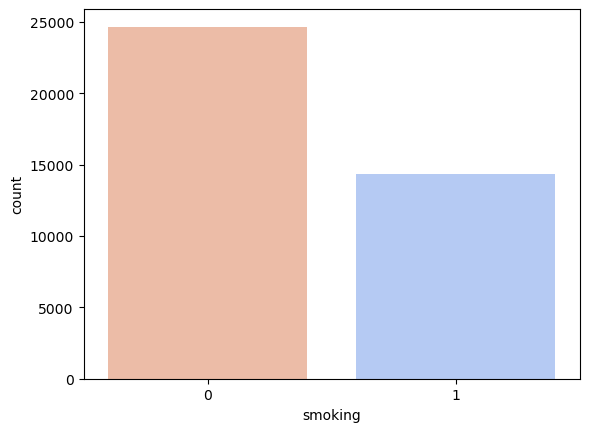

In [8]:
# checking total number of smoker users in dataset
sns.countplot(x='smoking', data=data, palette='coolwarm_r')
data['smoking'].value_counts()

In [9]:
#changing our Main prediction (dependent) variable "Churn" from Bool to Int type for detailed Statistical results
data['smoking'] = data['smoking'].astype('int64')

In [10]:
#To get statistical results like count, mean, std, quartiles and many more from the dataset
#we use the descsribe() function.
data.describe()

,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,relaxation,...,HDL,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,dental caries,smoking
count,38984.000000,38984.000000,38984.000000,38984.000000,38984.000000,38984.000000,38984.000000,38984.000000,38984.000000,38984.000000,...,38984.000000,38984.000000,38984.000000,38984.000000,38984.000000,38984.000000,38984.000000,38984.000000,38984.000000,38984.000000
mean,44.127591,164.689488,65.938718,82.062115,1.014955,1.008768,1.025369,1.026190,121.475631,75.994408,...,57.293146,115.081495,14.624264,1.086523,0.886030,26.198235,27.145188,39.905038,0.214421,0.367279
std,12.063564,9.187507,12.896581,9.326798,0.498527,0.493813,0.157246,0.159703,13.643521,9.658734,...,14.617822,42.883163,1.566528,0.402107,0.220621,19.175595,31.309945,49.693843,0.410426,0.482070
min,20.000000,130.000000,30.000000,51.000000,0.100000,0.100000,1.000000,1.000000,71.000000,40.000000,...,4.000000,1.000000,4.900000,1.000000,0.100000,6.000000,1.000000,2.000000,0.000000,0.000000
25%,40.000000,160.000000,55.000000,76.000000,0.800000,0.800000,1.000000,1.000000,112.000000,70.000000,...,47.000000,91.000000,13.600000,1.000000,0.800000,19.000000,15.000000,17.000000,0.000000,0.000000
50%,40.000000,165.000000,65.000000,82.000000,1.000000,1.000000,1.000000,1.000000,120.000000,76.000000,...,55.000000,113.000000,14.800000,1.000000,0.900000,23.000000,21.000000,26.000000,0.000000,0.000000
75%,55.000000,170.000000,75.000000,88.000000,1.200000,1.200000,1.000000,1.000000,130.000000,82.000000,...,66.000000,136.000000,15.800000,1.000000,1.000000,29.000000,31.000000,44.000000,0.000000,1.000000
max,85.000000,190.000000,135.000000,129.000000,9.900000,9.900000,2.000000,2.000000,233.000000,146.000000,...,359.000000,1860.000000,21.100000,6.000000,11.600000,1090.000000,2914.000000,999.000000,1.000000,1.000000


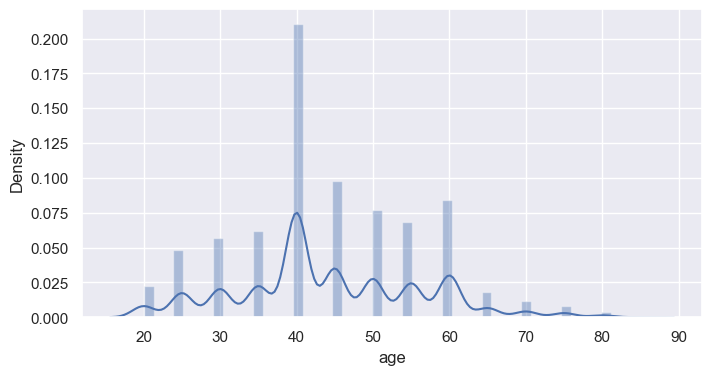

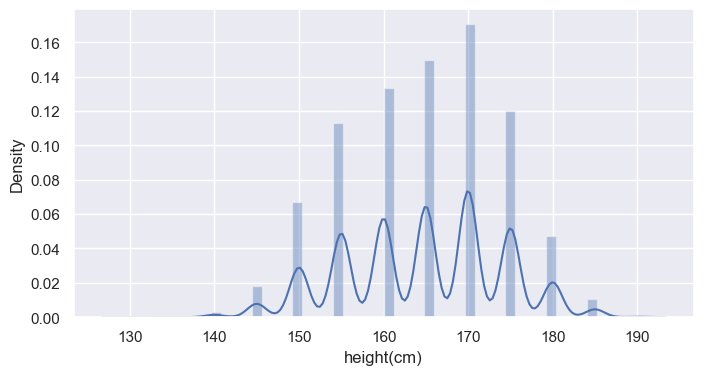

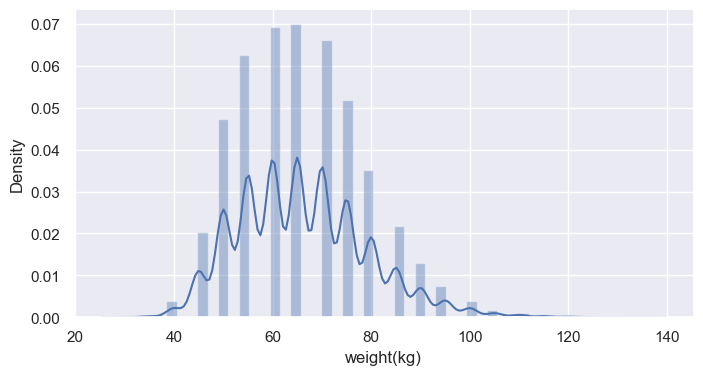

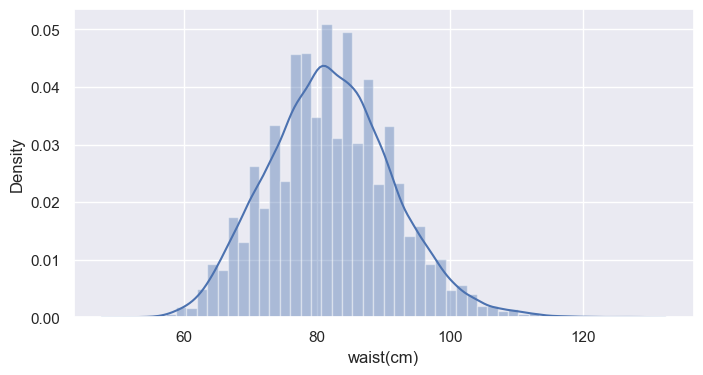

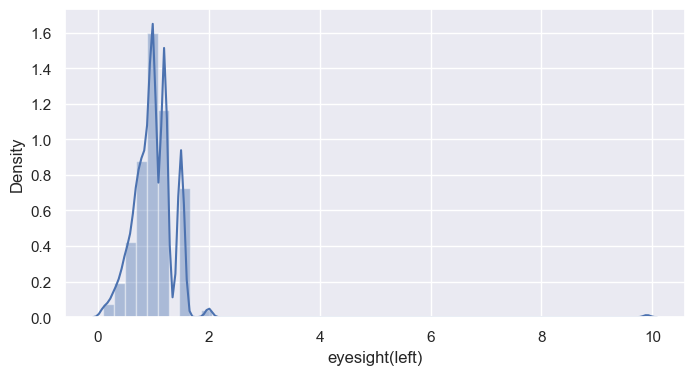

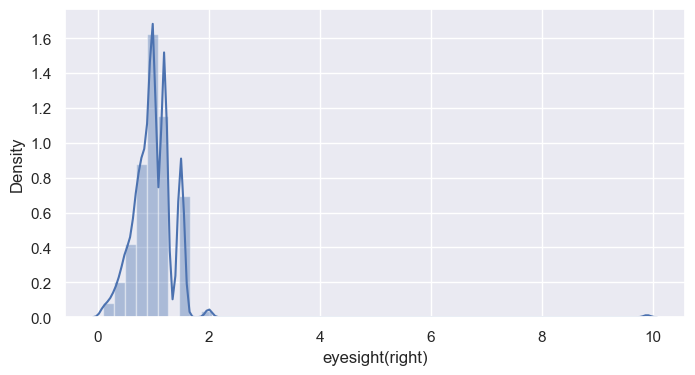

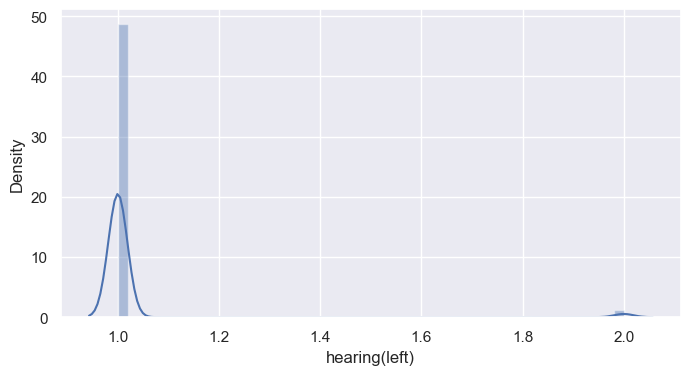

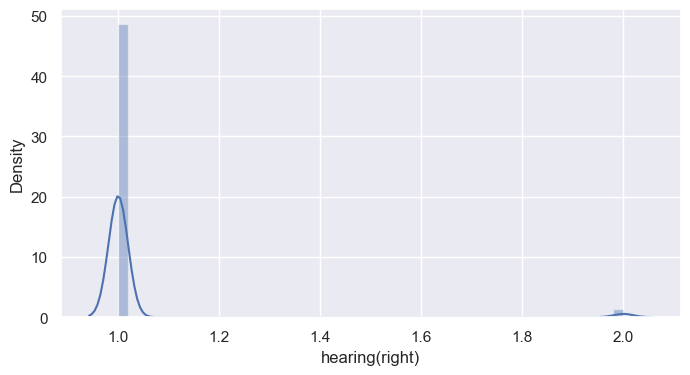

In [11]:
#Checking the distribution of Independent variables
field_names = data[[
    "age","height(cm)","weight(kg)","waist(cm)","eyesight(left)","eyesight(right)","hearing(left)","hearing(right)"
]]

for column in field_names.columns:
    sns.set(rc={"figure.figsize": (8, 4)});
    sns.distplot(data[column])
    plt.show()

<Axes: >

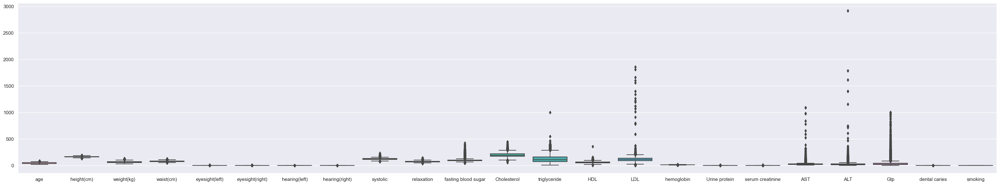

In [12]:
#Checking the Ranges of the predictor variables and dependent variable
plt.figure(figsize=(40,7))
sns.boxplot(data=data)

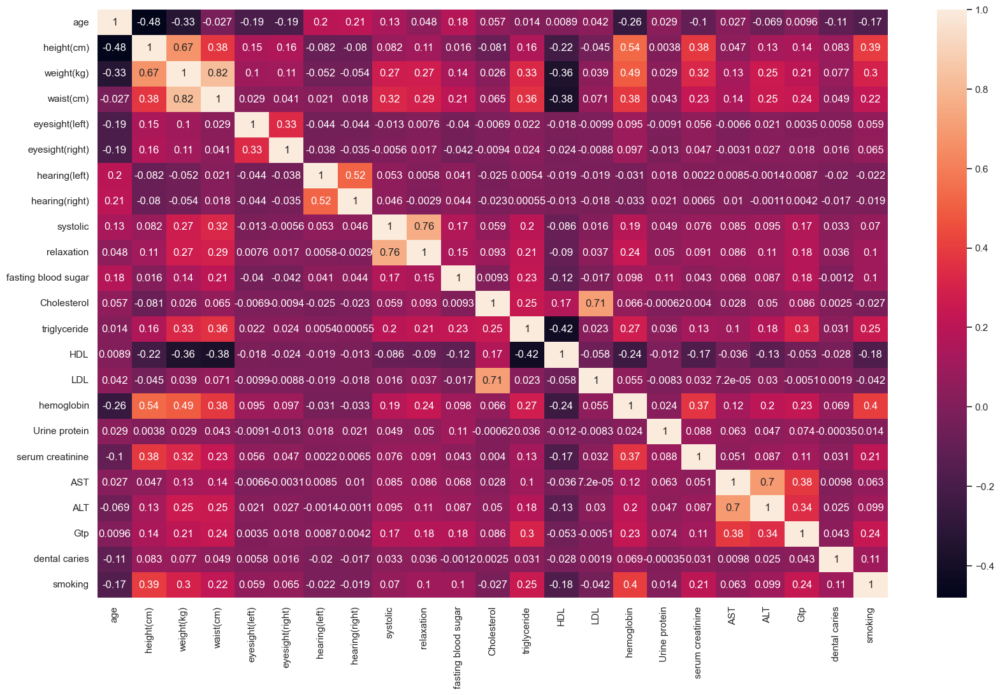

In [13]:
# Check colinearity among data columns
corr = data.corr()
plt.figure(figsize=(20,12))
sns.heatmap(corr, annot=True)
plt.show()

In [14]:
# creating dummy values for the categorical values to see the correlation between them
# dropping hearing(right) column as it has no relevance
dummy_data = pd.get_dummies(data, columns=['height(cm)', 'weight(kg)'])
dummy_data = dummy_data.drop(['hearing(right)'], axis=1)
dummy_data.head()
# dummy_data.isna().sum().sum()

,age,waist(cm),eyesight(left),eyesight(right),hearing(left),systolic,relaxation,fasting blood sugar,Cholesterol,triglyceride,...,weight(kg)_90,weight(kg)_95,weight(kg)_100,weight(kg)_105,weight(kg)_110,weight(kg)_115,weight(kg)_120,weight(kg)_125,weight(kg)_130,weight(kg)_135
0,35,97.0,0.9,0.9,1,118,78,97,239,153,...,0,0,0,0,0,0,0,0,0,0
1,20,110.0,0.7,0.9,1,119,79,88,211,128,...,0,0,0,0,1,0,0,0,0,0
2,45,86.0,0.9,0.9,1,110,80,80,193,120,...,0,0,0,0,0,0,0,0,0,0
3,45,94.0,0.8,0.7,1,158,88,249,210,366,...,0,0,0,0,0,0,0,0,0,0
4,20,81.0,1.5,0.1,1,109,64,100,179,200,...,0,0,0,0,0,0,0,0,0,0


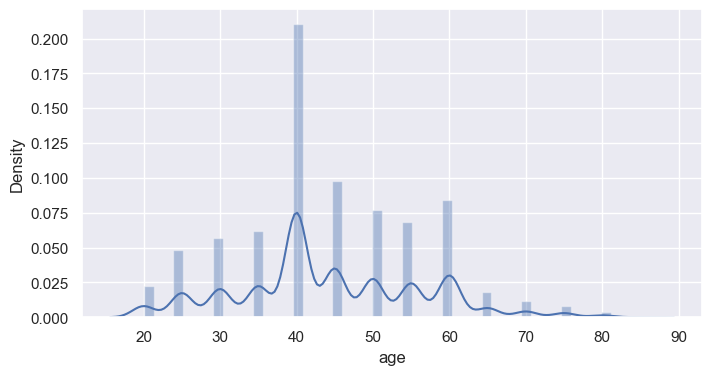

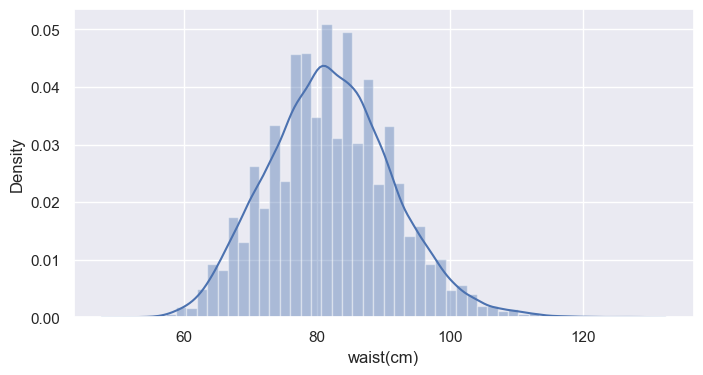

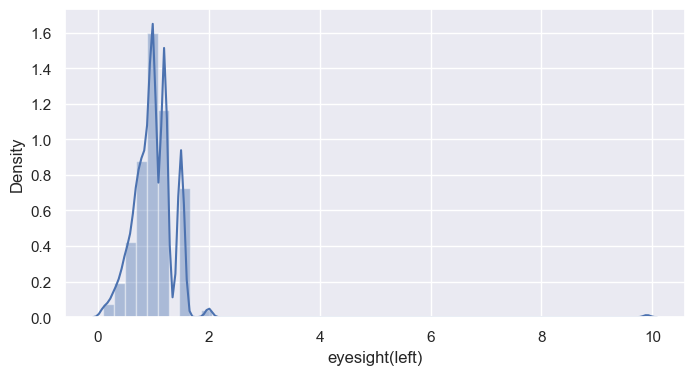

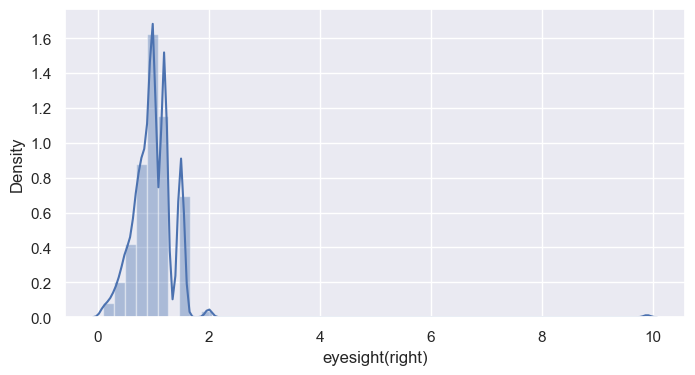

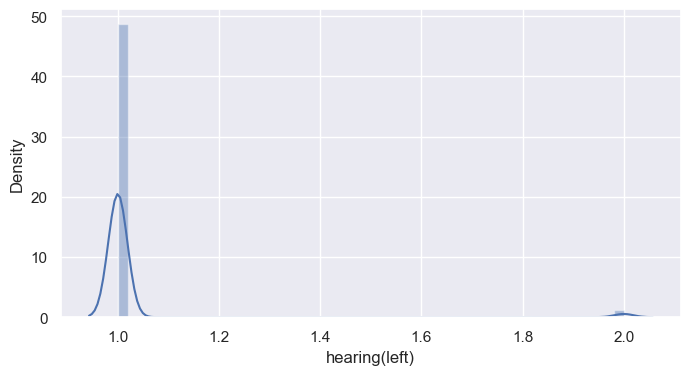

...

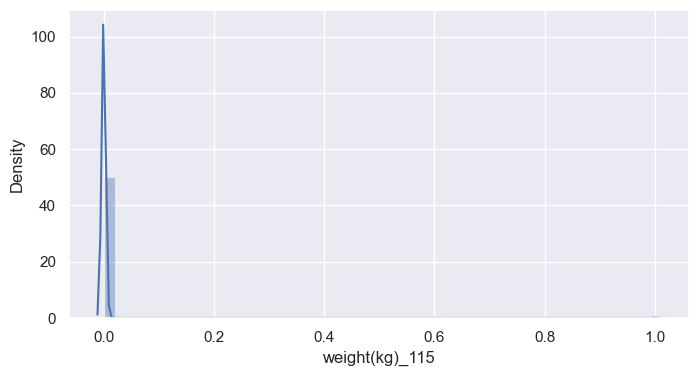

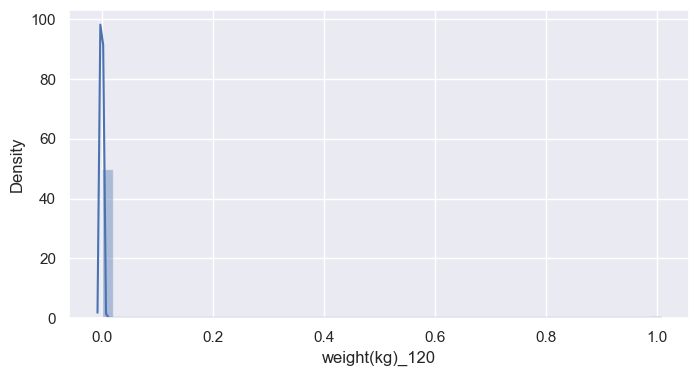

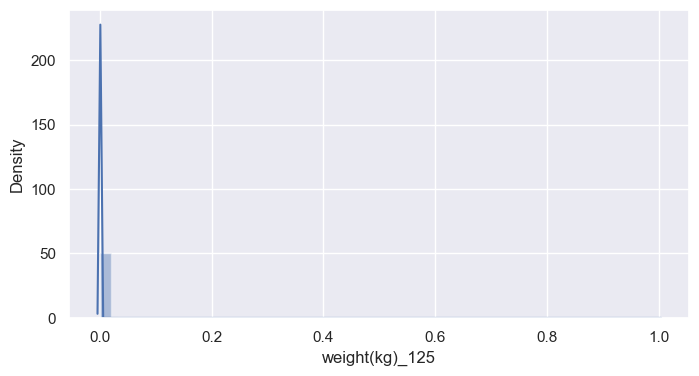

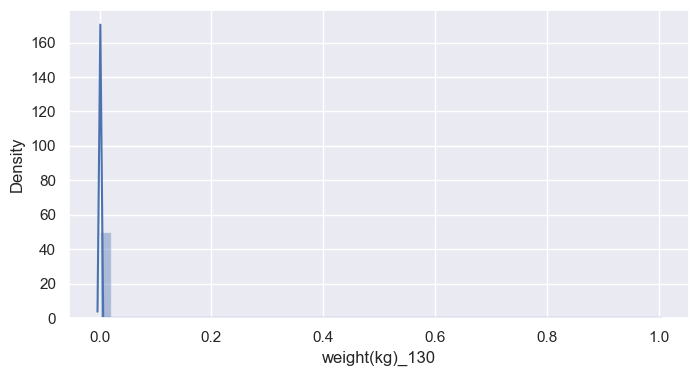

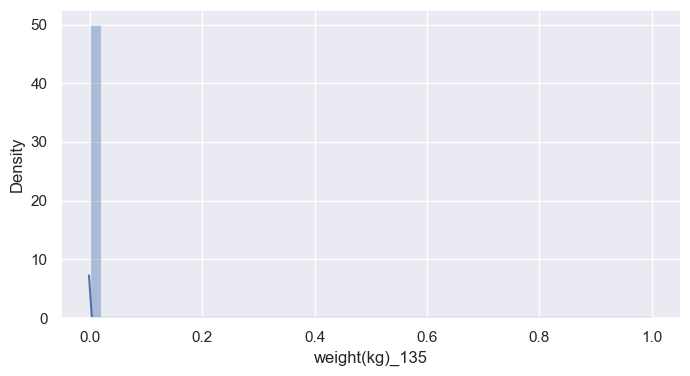

In [15]:
# Plotting graphs for categorical values (height,weight,hearing(right))
categorical_fields = dummy_data.columns
for column in categorical_fields:
    sns.set(rc={"figure.figsize": (8, 4)});
    sns.distplot(dummy_data[column])
    plt.show()

In [16]:
# Now we check the colinearity between the columns
sns.pairplot(dummy_data)

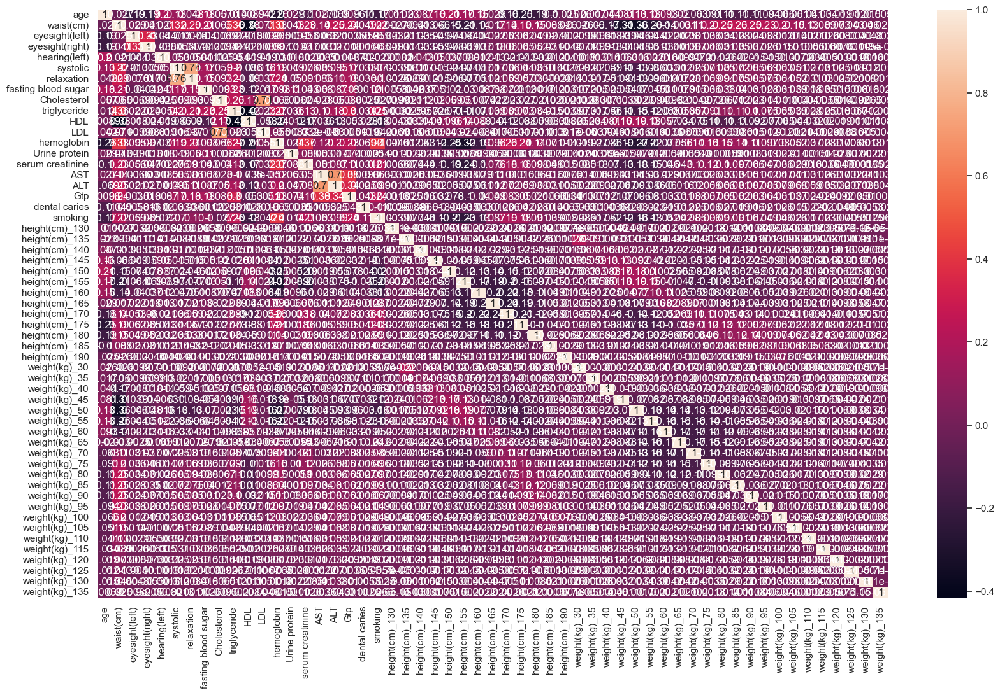

In [17]:
corr = dummy_data.corr()
plt.figure(figsize=(20,12))
sns.heatmap(corr, annot=True)
plt.show()

In [18]:
# Dependency correlation with smoking column
dummy_data.corr()['smoking'].sort_values(ascending=False)

smoking                1.000000
hemoglobin             0.401206
triglyceride           0.251057
Gtp                    0.240274
waist(cm)              0.223359
serum creatinine       0.212473
height(cm)_170         0.192803
height(cm)_175         0.175162
dental caries          0.107601
relaxation             0.103663
fasting blood sugar    0.099908
ALT                    0.098615
weight(kg)_80          0.097084
weight(kg)_75          0.095593
height(cm)_180         0.091232
weight(kg)_85          0.090891
height(cm)_165         0.086709
weight(kg)_70          0.084624
systolic               0.070176
weight(kg)_90          0.067347
eyesight(right)        0.064587
AST                    0.062834
eyesight(left)         0.059409
weight(kg)_95          0.048920
weight(kg)_100         0.046019
weight(kg)_65          0.042127
height(cm)_185         0.039064
weight(kg)_105         0.026001
weight(kg)_115         0.023174
weight(kg)_110         0.017286
Urine protein          0.013653
height(c

# Most dependent variable over here in dataset is heamoglobin,trygliceride,Gtp

In [19]:
"""
Now we gonna clean our final training dataset by dropping the columns which are not correlated in any case
or which were overlapping as pointed out in above observation
and get the clean features that will define our Learning Model
"""
columns_to_drop = [
    
    'Urine protein',
    'LDL',
    'age',
    'HDL'
]
dummy_data_with_corr = dummy_data.drop(columns_to_drop, axis=1)
dummy_data_with_corr.head()

,waist(cm),eyesight(left),eyesight(right),hearing(left),systolic,relaxation,fasting blood sugar,Cholesterol,triglyceride,hemoglobin,...,weight(kg)_90,weight(kg)_95,weight(kg)_100,weight(kg)_105,weight(kg)_110,weight(kg)_115,weight(kg)_120,weight(kg)_125,weight(kg)_130,weight(kg)_135
0,97.0,0.9,0.9,1,118,78,97,239,153,19.8,...,0,0,0,0,0,0,0,0,0,0
1,110.0,0.7,0.9,1,119,79,88,211,128,15.9,...,0,0,0,0,1,0,0,0,0,0
2,86.0,0.9,0.9,1,110,80,80,193,120,13.7,...,0,0,0,0,0,0,0,0,0,0
3,94.0,0.8,0.7,1,158,88,249,210,366,16.9,...,0,0,0,0,0,0,0,0,0,0
4,81.0,1.5,0.1,1,109,64,100,179,200,14.9,...,0,0,0,0,0,0,0,0,0,0


In [20]:
dummy_data_with_corr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38984 entries, 0 to 38983
Data columns (total 51 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   waist(cm)            38984 non-null  float64
 1   eyesight(left)       38984 non-null  float64
 2   eyesight(right)      38984 non-null  float64
 3   hearing(left)        38984 non-null  int64  
 4   systolic             38984 non-null  int64  
 5   relaxation           38984 non-null  int64  
 6   fasting blood sugar  38984 non-null  int64  
 7   Cholesterol          38984 non-null  int64  
 8   triglyceride         38984 non-null  int64  
 9   hemoglobin           38984 non-null  float64
 10  serum creatinine     38984 non-null  float64
 11  AST                  38984 non-null  int64  
 12  ALT                  38984 non-null  int64  
 13  Gtp                  38984 non-null  int64  
 14  dental caries        38984 non-null  int64  
 15  smoking              38984 non-null 

#### Through Pearson's Correlation we got the following output:
Columns shown in above table are the features that we are gonna use to predict the smoker detection test

#### Now we find the features through KBest
The algorithm is simple: we simply provide a method of calculating the importance of a feature and the number of features we want to use, denoted as k. Then, the algorithm simply returns the top k features.<br>
The main advantage of this method is that we are free to choose among a variety of ways to compute the importance of a feature.<br>
Here, we use the chi squared test, as we are working with a classification task.

In [21]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2, f_classif
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split

dt = DecisionTreeClassifier(random_state=42)

# First we make dummy data from original data
dummy_data_v2 = pd.get_dummies(data, columns=['height(cm)', 'weight(kg)'])
dummy_data_v2 = dummy_data_v2.drop(['hearing(right)'], axis=1)

# Make Testing and Training Data
X = dummy_data_v2.drop(['smoking'], axis=1)
y = dummy_data_v2['smoking']
X_train, X_test, y_train, y_test = train_test_split(X, 
                                                    y, 
                                                    test_size=0.2, 
                                                    shuffle=True, 
                                                    stratify=y, 
                                                    random_state=42)
# Make copy of this Test Data
X_train_v1, X_test_v1, y_train_v1, y_test_v1 = X_train.copy(), X_test.copy(), y_train.copy(), y_test.copy()

f1_score_list = []

for k in range(1, 20):
    selector = SelectKBest(chi2, k=k)
    selector.fit(X_train_v1, y_train_v1)
    
    sel_X_train_v1 = selector.transform(X_train_v1)
    sel_X_test_v1 = selector.transform(X_test_v1)
    
    dt.fit(sel_X_train_v1, y_train_v1)
    kbest_preds = dt.predict(sel_X_test_v1)
    f1_score_kbest = round(f1_score(y_test, kbest_preds, average='weighted'), 3)
    f1_score_list.append(f1_score_kbest)
  
print(f1_score_list)


[0.657, 0.668, 0.688, 0.696, 0.711, 0.711, 0.707, 0.716, 0.71, 0.721, 0.726, 0.737, 0.74, 0.729, 0.734, 0.731, 0.73, 0.732, 0.731]


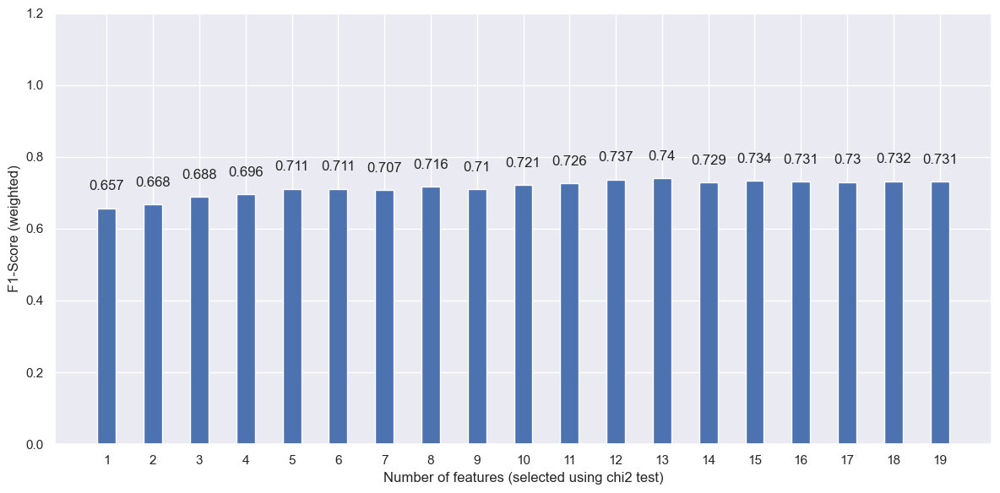

In [22]:
# We can now plot the F1-score for each number of variables used in the model:
fig, ax = plt.subplots(figsize=(12, 6))
x = ['1','2','3','4','5','6','7','8','9','10','11','12','13', '14', '15', '16', '17', '18', '19']
y = f1_score_list
ax.bar(x, y, width=0.4)
ax.set_xlabel('Number of features (selected using chi2 test)')
ax.set_ylabel('F1-Score (weighted)')
ax.set_ylim(0, 1.2)
for index, value in enumerate(y):
    plt.text(x=index, y=value + 0.05, s=str(value), ha='center')
    
plt.tight_layout()

The above observation shows that when we use top 12 features then we get the best score which is of 0.74 . But this increases our features dependencies, so let's test with some other test than "chi squared test" to check the validation such as f_classif which returns the number of best features we want, or maybe we get some improved results.

In [23]:
X_new = dummy_data_v2.drop(['smoking'], axis=1)
Y_new = dummy_data_v2['smoking']

# Create and fit selector
selector = SelectKBest(f_classif, k=4)
selector.fit(X_new, Y_new)

# Now selector will take the best featured columns
cols = selector.get_support(indices=True)
new_feature_data = X_new.iloc[:,cols]
print(new_feature_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38984 entries, 0 to 38983
Data columns (total 4 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   triglyceride    38984 non-null  int64  
 1   hemoglobin      38984 non-null  float64
 2   Gtp             38984 non-null  int64  
 3   height(cm)_155  38984 non-null  uint8  
dtypes: float64(1), int64(2), uint8(1)
memory usage: 951.9 KB
None


In [24]:
new_feature_data['smoking'] = Y_new
new_feature_data.head()

,triglyceride,hemoglobin,Gtp,height(cm)_155,smoking
0,153,19.8,125,0,1
1,128,15.9,30,0,0
2,120,13.7,276,1,0
3,366,16.9,36,0,0
4,200,14.9,15,0,0


#### Through the KBest features method, we got the following output:
Columns shown in above table are the features that we can use to predict the smoker behaviour. The only difference here we got from the Pearson's correlation model is that we decided to drop which column.

In [29]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.preprocessing import MinMaxScaler

X_v2 = dummy_data_v2.drop(['smoking'], axis=1)
y_v2 = dummy_data_v2[['smoking']]
y_v2 = y_v2.values.ravel()

X_train_v2, X_test_v2, y_train_v2, y_test_v2 = train_test_split(X_v2, y_v2, test_size=0.2, random_state=42, stratify=y_v2)

scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train_v2)
X_test = scaler.transform(X_test_v2)

In [28]:
#importing the necessary libraries
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
# Sequential Forward Selection(sfs)
sfs = SFS(LogisticRegression(),
          k_features='best',
          forward=True,
          floating=False,
          scoring = 'precision',
          cv = 0)
sfs.fit(X_v2, y_v2)
sfs.k_feature_names_ 

('hearing(left)', 'Cholesterol', 'height(cm)_165', 'weight(kg)_115')

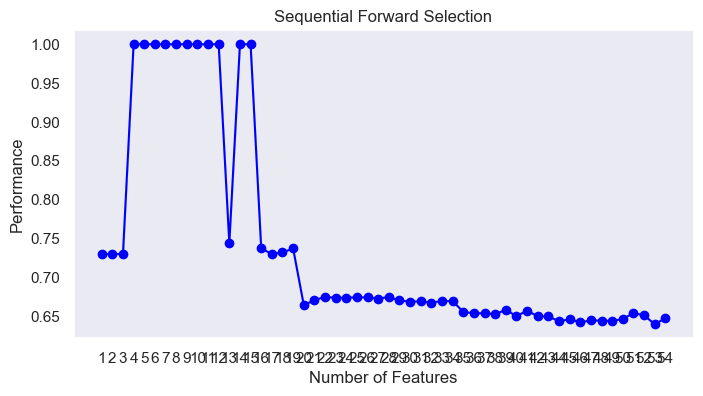

In [31]:
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
fig1 = plot_sfs(sfs.get_metric_dict(), kind='std_dev')
plt.title('Sequential Forward Selection')
plt.grid()
plt.show()

In [33]:
#Using OLS for finding the p value to check the significant features
import statsmodels.api as sm

model = sm.OLS(dummy_data['smoking'], dummy_data[['hearing(left)',  'height(cm)_165', 'weight(kg)_115']]).fit()

# Print out the statistics
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                smoking   R-squared (uncentered):                   0.362
Model:                            OLS   Adj. R-squared (uncentered):              0.362
Method:                 Least Squares   F-statistic:                              7365.
Date:                Sat, 30 Sep 2023   Prob (F-statistic):                        0.00
Time:                        14:20:19   Log-Likelihood:                         -27039.
No. Observations:               38984   AIC:                                  5.408e+04
Df Residuals:                   38981   BIC:                                  5.411e+04
Df Model:                           3                                                  
Covariance Type:            nonrobust                                                  
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
hearing(left)      0.3275      0.003    125.628      0.000       0.322       0.333
height(cm)_165     0.1193      0.006     18.710      0.000       0.107       0.132
weight(kg)_115     0.4022      0.080      5.050      0.000       0.246       0.558
==============================================================================
Omnibus:                   187693.374   Durbin-Watson:                   1.998
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             6054.040
Skew:                           0.526   Prob(JB):                         0.00
Kurtosis:                       1.381   Cond. No.                         34.3
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [34]:
from sklearn.metrics import r2_score, mean_squared_error
logisticRegr = LogisticRegression()
X_dummy_data = dummy_data_v2[['hearing(left)','height(cm)_165', 'weight(kg)_115']]
y_dummy_data = dummy_data_v2[['smoking']]
X_train_data, X_test_data, y_train_data, y_test_data = train_test_split(X_dummy_data, y_dummy_data, test_size=0.2, random_state=42, stratify=y_dummy_data)
logisticRegr.fit(X_train_data, y_train_data)
threshold = 0.5
logisticRegr.predict(X_test_data)

array([0, 0, 0, ..., 0, 0, 0])

# ### As we have a classification problem, So we are going to use Logistic Regression


In [35]:
s1= logisticRegr.predict(X_test_data)

In [36]:
# Finding Root mean square error to check how much chances of error are there in our model
rms = mean_squared_error(y_test_v2, s1, squared=False)
rms

0.6057524255222059

In [38]:
 #Checking the accuracy of our model with outliers
logisticRegr.score(X_test_data, y_test_data)

0.6330639989739644

In [39]:
# Now we create confusion matrix
from sklearn.metrics import confusion_matrix

conf_matrix = confusion_matrix(y_test_v2, s1)
print(conf_matrix)

[[4932    1]
 [2860    4]]


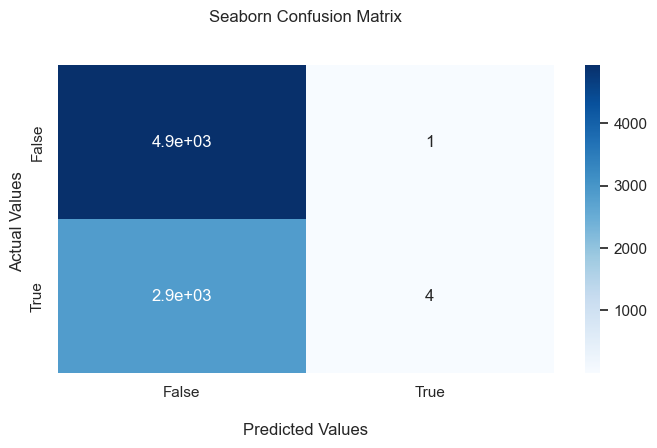

In [41]:
axes = sns.heatmap(conf_matrix, annot=True, cmap='Blues')

axes.set_title('Seaborn Confusion Matrix\n\n');
axes.set_xlabel('\nPredicted Values')
axes.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
axes.xaxis.set_ticklabels(['False','True'])
axes.yaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()

## Now we will remove outliers from the dataset and then test the accuracy.

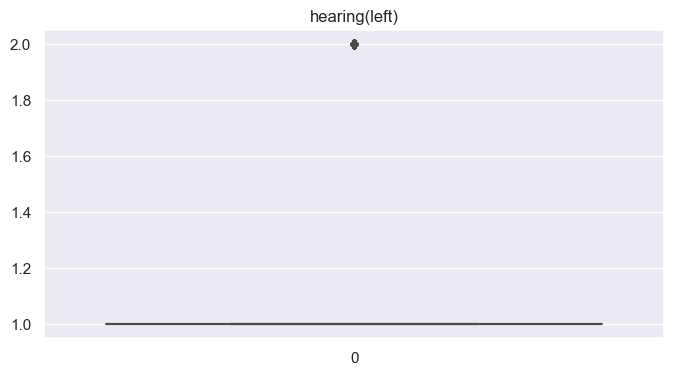

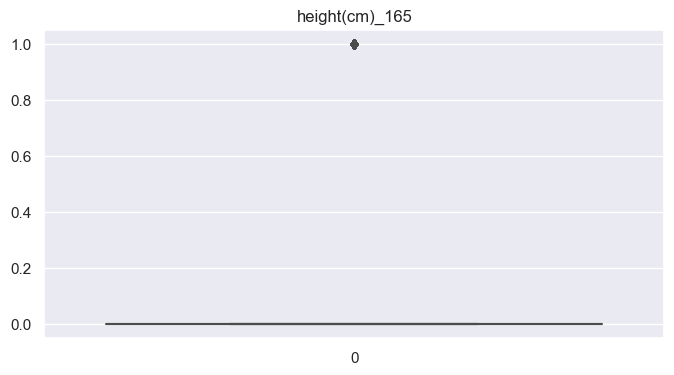

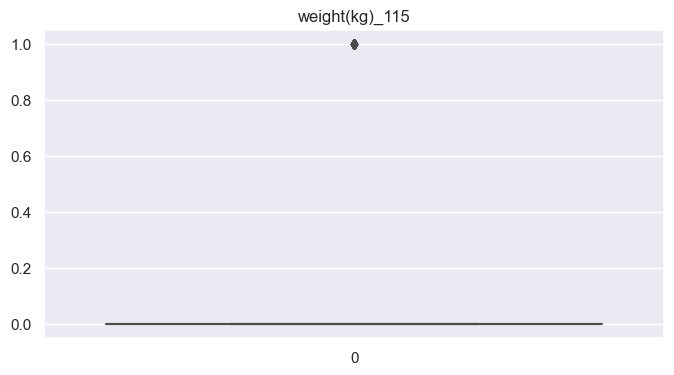

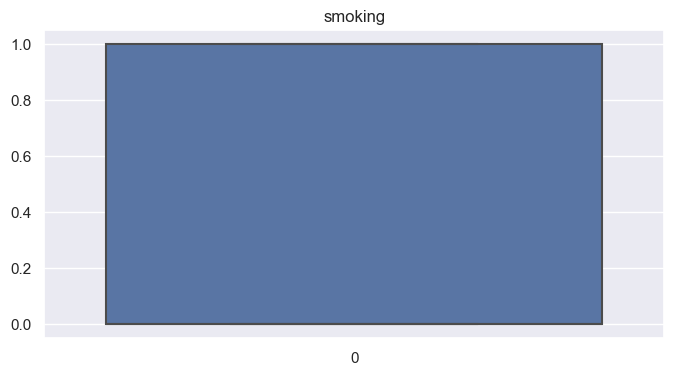

In [42]:
# First we make boxplot of the features we selected to predict the outliers and remove if any
featured_dataset = dummy_data_v2[['hearing(left)','height(cm)_165', 'weight(kg)_115','smoking']]
fields = featured_dataset.columns
for column in fields:
    sns.boxplot(data=featured_dataset[column])
    plt.title(column)
    plt.show()

In [44]:
"""
Normalizing the data in the Total day minutes and Customer service calls column 
beacuse the value is too high when compared to other independent variable
"""

from sklearn import preprocessing

# Create x to store scaled values as floats
x = featured_dataset[['smoking', 'height(cm)_165']].values.astype(float)

# Preparing for normalizing
min_max_scaler = preprocessing.MinMaxScaler()

# Transform the data to fit minmax processor
x_scaled = min_max_scaler.fit_transform(x)

# Run the normalizer on the dataframe
featured_dataset[['smoking', 'height(cm)_165']] = pd.DataFrame(x_scaled)

<Axes: >

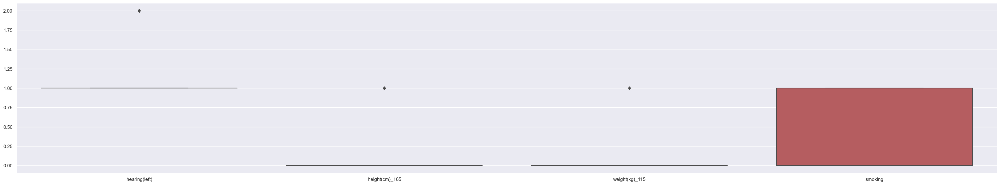

In [45]:
plt.figure(figsize=(40,7))
sns.boxplot(data=featured_dataset)

In [49]:
dataset_a = data.copy()

# Selecting 1% of data from height column
dataset_a_1_perc = dataset_a['smoking'].sample(frac=0.01)
# Replacing selected column values by NaN
dataset_a['smoking'].loc[dataset_a.index.isin(dataset_a_1_perc.index)]=np.NaN

#Count of null values in Income row 
dataset_a['smoking'].isnull().sum()

390

In [50]:
# Now we will be using Mean Imputation method to replace Null values
dataset_a['smoking'] = dataset_a['smoking'].fillna(dataset_a['smoking'].mean())
dataset_a

,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,relaxation,...,HDL,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,dental caries,smoking
0,35,170,85,97.0,0.9,0.9,1,1,118,78,...,70,142,19.8,1,1.0,61,115,125,1,1.0
1,20,175,110,110.0,0.7,0.9,1,1,119,79,...,71,114,15.9,1,1.1,19,25,30,1,0.0
2,45,155,65,86.0,0.9,0.9,1,1,110,80,...,57,112,13.7,3,0.6,1090,1400,276,0,0.0
3,45,165,80,94.0,0.8,0.7,1,1,158,88,...,46,91,16.9,1,0.9,32,36,36,0,0.0
4,20,165,60,81.0,1.5,0.1,1,1,109,64,...,47,92,14.9,1,1.2,26,28,15,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38979,40,165,60,80.0,0.4,0.6,1,1,107,60,...,61,72,12.3,1,0.5,18,18,21,1,0.0
38980,45,155,55,75.0,1.5,1.2,1,1,126,72,...,76,131,12.5,2,0.6,23,11,12,0,0.0
38981,40,170,105,124.0,0.6,0.5,1,1,141,85,...,48,138,17.1,1,0.8,24,23,35,1,1.0
38982,40,160,55,75.0,1.5,1.5,1,1,95,69,...,79,116,12.0,1,0.6,24,20,17,0,1.0


In [51]:
#checking recovery after mean imputation in column 
dataset_a.isnull().sum()

age                    0
height(cm)             0
weight(kg)             0
waist(cm)              0
eyesight(left)         0
eyesight(right)        0
hearing(left)          0
hearing(right)         0
systolic               0
relaxation             0
fasting blood sugar    0
Cholesterol            0
triglyceride           0
HDL                    0
LDL                    0
hemoglobin             0
Urine protein          0
serum creatinine       0
AST                    0
ALT                    0
Gtp                    0
dental caries          0
smoking                0
dtype: int64

In [57]:
#Now we detect the outliers and separate them
# We will be using Inter Quartile Range method to detect outliers

# First we calculate 25 and 75 percentile for both columns
total_smoking_25_perc = featured_dataset['smoking'].quantile(0.25)
total_smoking_75_perc = featured_dataset['smoking'].quantile(0.75)
total_smoking_iqr = total_smoking_75_perc - total_smoking_25_perc

# Now we find the upper and lower limit
total_smoking_limit_upper_perc = total_smoking_75_perc + 1.5 * total_smoking_iqr
total_smoking_limit_lower_perc = total_smoking_25_perc - 1.5 * total_smoking_iqr

# Finding outliers
new_dataset = featured_dataset[featured_dataset['smoking'] < total_smoking_limit_upper_perc]
new_dataset = new_dataset[new_dataset['smoking'] > total_smoking_limit_lower_perc]

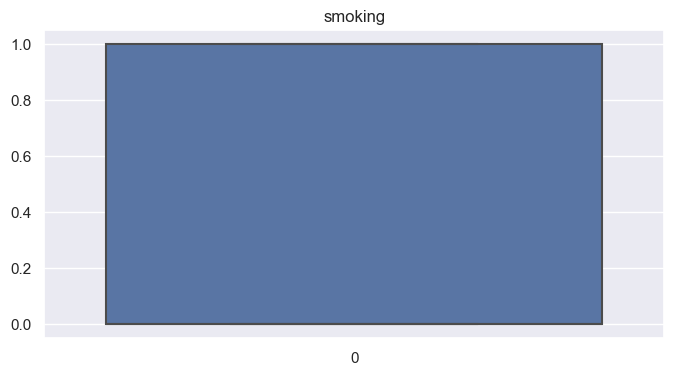

In [58]:
# Now we box plot the features with no outliers
featured_dataset_no_outliers = new_dataset[['smoking']]
fields_no_outliers = featured_dataset_no_outliers.columns
for column in fields_no_outliers:
    sns.boxplot(data=featured_dataset_no_outliers[column])
    plt.title(column)
    plt.show()

In [60]:
# Now we apply Logistic Regression on our new dataset without Outliers
logisticRegrNoOutliers = LogisticRegression()

y_no_outlier_data = new_dataset[['smoking']]
X_train_no_outlier_data, X_test_no_outlier_data, y_train_no_outlier_data, y_test_no_outlier_data = train_test_split(X_no_outlier_data, y_no_outlier_data, test_size=0.2, random_state=42, stratify=y_no_outlier_data)
logisticRegrNoOutliers.fit(X_train_no_outlier_data, y_train_no_outlier_data)
threshold = 0.5
logisticRegrNoOutliers.predict(X_test_no_outlier_data)

array([0., 0., 0., ..., 0., 0., 0.])

In [61]:
s2= logisticRegrNoOutliers.predict(X_test_no_outlier_data)

In [62]:
# now we find Root Mean Square error for our new dataset with no outliers
rms = mean_squared_error(y_test_no_outlier_data, s2, squared=False)
rms

0.5796780804265615

In [63]:
# Now we find our score for new dataset with no outliers
logisticRegrNoOutliers.score(X_test_no_outlier_data, y_test_no_outlier_data)

0.6639733230729767

In [64]:
# Now we create confusion matrix for feature dataset with no outliers
from sklearn.metrics import confusion_matrix

conf_matrix_no_outliers = confusion_matrix(y_test_no_outlier_data, s2)
print(conf_matrix_no_outliers)

[[3987  946]
 [1674 1190]]


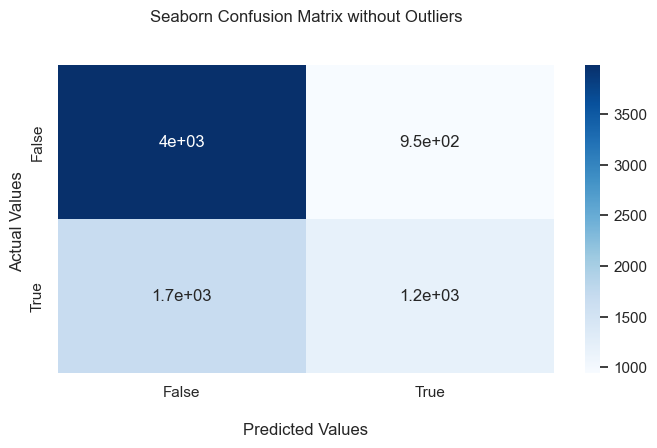

In [66]:
axes = sns.heatmap(conf_matrix_no_outliers, annot=True, cmap='Blues')

axes.set_title('Seaborn Confusion Matrix without Outliers\n\n');
axes.set_xlabel('\nPredicted Values')
axes.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
axes.xaxis.set_ticklabels(['False','True'])
axes.yaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()

### Now we check check the % error on residuals for numeric data and check for bias and variance of the error by removing data and applying Imputation

In [67]:
dataset_a = data.copy()

# Selecting 1% of data from Total day minutes column
dataset_a_1_perc = dataset_a['smoking'].sample(frac=0.01)
# Replacing selected column values by NaN
dataset_a['smoking'].loc[dataset_a.index.isin(dataset_a_1_perc.index)]=np.NaN

#Count of null values in Income row 
dataset_a['smoking'].isnull().sum()

390

In [68]:
# Now we will be using Mean Imputation method to replace Null values
dataset_a['smoking'] = dataset_a['smoking'].fillna(dataset_a['smoking'].mean())
dataset_a

,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,relaxation,...,HDL,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,dental caries,smoking
0,35,170,85,97.0,0.9,0.9,1,1,118,78,...,70,142,19.8,1,1.0,61,115,125,1,1.0
1,20,175,110,110.0,0.7,0.9,1,1,119,79,...,71,114,15.9,1,1.1,19,25,30,1,0.0
2,45,155,65,86.0,0.9,0.9,1,1,110,80,...,57,112,13.7,3,0.6,1090,1400,276,0,0.0
3,45,165,80,94.0,0.8,0.7,1,1,158,88,...,46,91,16.9,1,0.9,32,36,36,0,0.0
4,20,165,60,81.0,1.5,0.1,1,1,109,64,...,47,92,14.9,1,1.2,26,28,15,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38979,40,165,60,80.0,0.4,0.6,1,1,107,60,...,61,72,12.3,1,0.5,18,18,21,1,0.0
38980,45,155,55,75.0,1.5,1.2,1,1,126,72,...,76,131,12.5,2,0.6,23,11,12,0,0.0
38981,40,170,105,124.0,0.6,0.5,1,1,141,85,...,48,138,17.1,1,0.8,24,23,35,1,1.0
38982,40,160,55,75.0,1.5,1.5,1,1,95,69,...,79,116,12.0,1,0.6,24,20,17,0,1.0


In [69]:
# # Checking Bias and Variance for 1% imputed data by mean
from mlxtend.evaluate import bias_variance_decomp
avg_expected_loss, avg_bias, avg_var = bias_variance_decomp(logisticRegrNoOutliers, X_train_no_outlier_data.values, y_train_no_outlier_data.values, X_test_no_outlier_data.values, 
                                      y_test_no_outlier_data.values, loss='0-1_loss', random_seed=123)
# summarize results
print('Expected loss: %.3f' % avg_expected_loss)
print('Bias: %.3f' % avg_bias)
print('Variance: %.3f' % avg_var)

Expected loss: 0.440
Bias: 3430.806
Variance: 0.007


In [71]:
dataset_b = data.copy()

# Selecting 1% of data from smoking column
dataset_b_1_perc = dataset_b['smoking'].sample(frac=0.05)
# Replacing selected column values by NaN
dataset_b['smoking'].loc[dataset_b.index.isin(dataset_b_1_perc.index)]=np.NaN

#Count of null values in Income row 
dataset_b['smoking'].isnull().sum()

1949

In [72]:
dataset_b['smoking'] = dataset_b['smoking'].fillna(dataset_b['smoking'].median())
dataset_b

,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,relaxation,...,HDL,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,dental caries,smoking
0,35,170,85,97.0,0.9,0.9,1,1,118,78,...,70,142,19.8,1,1.0,61,115,125,1,1.0
1,20,175,110,110.0,0.7,0.9,1,1,119,79,...,71,114,15.9,1,1.1,19,25,30,1,0.0
2,45,155,65,86.0,0.9,0.9,1,1,110,80,...,57,112,13.7,3,0.6,1090,1400,276,0,0.0
3,45,165,80,94.0,0.8,0.7,1,1,158,88,...,46,91,16.9,1,0.9,32,36,36,0,0.0
4,20,165,60,81.0,1.5,0.1,1,1,109,64,...,47,92,14.9,1,1.2,26,28,15,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38979,40,165,60,80.0,0.4,0.6,1,1,107,60,...,61,72,12.3,1,0.5,18,18,21,1,0.0
38980,45,155,55,75.0,1.5,1.2,1,1,126,72,...,76,131,12.5,2,0.6,23,11,12,0,0.0
38981,40,170,105,124.0,0.6,0.5,1,1,141,85,...,48,138,17.1,1,0.8,24,23,35,1,1.0
38982,40,160,55,75.0,1.5,1.5,1,1,95,69,...,79,116,12.0,1,0.6,24,20,17,0,1.0


In [73]:
# Checking Bias and Variance for 5% imputed data by median

avg_expected_loss, avg_bias, avg_var = bias_variance_decomp(logisticRegrNoOutliers, X_train_no_outlier_data.values, y_train_no_outlier_data.values, X_test_no_outlier_data.values, 
                                      y_test_no_outlier_data.values, loss='0-1_loss', random_seed=123)
# summarize results
print('Expected loss: %.3f' % avg_expected_loss)
print('Bias: %.3f' % avg_bias)
print('Variance: %.3f' % avg_var)

Expected loss: 0.440
Bias: 3430.806
Variance: 0.007


In [74]:
# Checking Bias and Variance for 10% imputed data by mode

avg_expected_loss, avg_bias, avg_var = bias_variance_decomp(logisticRegrNoOutliers, X_train_no_outlier_data.values, y_train_no_outlier_data.values, X_test_no_outlier_data.values, 
                                      y_test_no_outlier_data.values, loss='0-1_loss', random_seed=123)
# summarize results
print('Expected loss: %.3f' % avg_expected_loss)
print('Bias: %.3f' % avg_bias)
print('Variance: %.3f' % avg_var)

Expected loss: 0.440
Bias: 3430.806
Variance: 0.007


Answers to the following questions:
1. Which independent variables are useful to predict a target (dependent variable)?
A. height(cm),weight(kg),hearing(left)

2. Which independent variable have missing data? How much?
A. No independent variable had missing data.

3. Do the training and test sets have the same data?
A. We Splitted data in 80:20 train vs test data

4. Do the ranges of the predictor variables make sense?
A. We normalised the data while using Logistic Regression and the model is running with the accuracy of 70% when we remove the outliers.

6. What are the distributions of the predictor variables? 
A. All the predictor variables have Normal Distribution.